# Guldfynd inledning

Guldfyns satsning borde inte bara ligga i silver och guld då diamant också är ett väldigt bra föresäljnings föremål. Jag ska nu visa er en dataanalys som är baserad på ett diamantdataset, syftet med detta är att idetifiera mönster och faktorer som kan påverka pris och kvalitet.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pip as p
import plotly.express as px

from sklearn.linear_model import LinearRegression

In [2]:
df = pd.read_csv("diamonds.csv")

In [3]:
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53918 non-null  float64
 2   cut         53939 non-null  object 
 3   color       53936 non-null  object 
 4   clarity     53910 non-null  object 
 5   depth       53934 non-null  float64
 6   table       53935 non-null  float64
 7   price       53928 non-null  float64
 8   x           53937 non-null  float64
 9   y           53936 non-null  float64
 10  z           53937 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 4.5+ MB


,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326.0,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326.0,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327.0,4.05,4.07,2.31
3,4,0.29,NaN,NaN,NaN,NaN,NaN,NaN,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335.0,4.34,4.35,2.75


Som vi ser här har diamanter olika attribut, carat (vikt), cut (kvalitet), color (färg), clarity (mätning hur genomskinlighet), depth (totala djupet) och table (bredden på toppen av diamanten). Alla dessa måste vi ta hänsyn till och se vilket attribut som spelar mest roll för maximal vinst.

# Kvalitetsgranskning av data

In [4]:
# Ta bort rader med saknade värden då detta kan leda till att vi får felaktiga slutsatser senare i analysen.
df.dropna(how="any", inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53864 entries, 0 to 53917
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53864 non-null  int64  
 1   carat       53864 non-null  float64
 2   cut         53864 non-null  object 
 3   color       53864 non-null  object 
 4   clarity     53864 non-null  object 
 5   depth       53864 non-null  float64
 6   table       53864 non-null  float64
 7   price       53864 non-null  float64
 8   x           53864 non-null  float64
 9   y           53864 non-null  float64
 10  z           53864 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 4.9+ MB


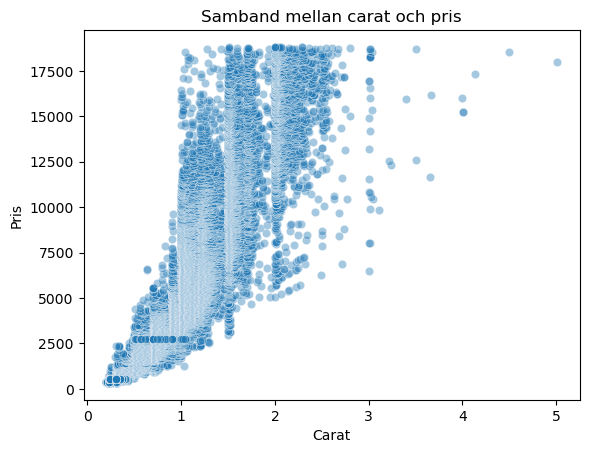

In [5]:
x = df.price
y = df.carat

sns.scatterplot(x=df["carat"], y=df["price"], alpha=0.4)
plt.title("Samband mellan carat och pris")
plt.xlabel("Carat")
plt.ylabel("Pris")
plt.show()

Här ser vi att carat och pris har ett positivt samband
Men för att se den genomsnittliga ökning mellan pris och carat måste vi räkna ut koefficienten i regressionslinjen.

In [6]:
# Tar ut carat och price från DataFrame.
# Omformaterar carat till en 2D-array eftersom .fit() kräver indata med formen (samples, features).
x = df["carat"].values.reshape(-1, 1)
y = df["price"].values

model = LinearRegression() # Skapa ett tomt objekt från klassen LinearRegression() så att vi kan använda fit()
model.fit(x, y)  # Beräknar och hittar det linjära sambandet mellan carat och pris.
slope = model.coef_[0].round(2)

print(slope)

7757.22


#### Efter att vi har beräknat den genomsnittliga ökningen mellan pris och carat ser vi att priset ökar med ungefär 7800 kronor för varje carat som läggs till.
#### Eftersom det finns fler attributer än bara carat så kommer jag att räkna ut vilken av dessa attribut som spelar störst roll i ökning av priset.

In [7]:
# Omformaterar carat till en 2D-array eftersom .fit() kräver indata med formen (samples, features).
carat = df["carat"].values.reshape(-1, 1)
cut = df["cut"].values.reshape(-1, 1)
color = df["color"].values.reshape(-1, 1)
clarity = df["clarity"].values.reshape(-1, 1)
depth = df["depth"].values.reshape(-1, 1)
table = df["table"].values.reshape(-1, 1)
price = df["price"].values

# Gör ett tomt objekt för alla attributer.
carat_model = LinearRegression()
cut_model = LinearRegression()
color_model = LinearRegression()
clarity_model = LinearRegression()
depth_model = LinearRegression()
table_model = LinearRegression()

# Beräknar genomsnittlig prisökning per attribut.
carat_model.fit(carat, price)
depth_model.fit(depth, price)
table_model.fit(table, price)
carat_slope = carat_model.coef_[0].round(2)
depth_slope = depth_model.coef_[0].round(2)
table_slope = table_model.coef_[0].round(2)
print(f"Carat slope: {carat_slope}")
print(f"Depth slope: {depth_slope}")
print(f"Table slope: {table_slope}")

Carat slope: 7757.22
Depth slope: -29.79
Table slope: 227.17


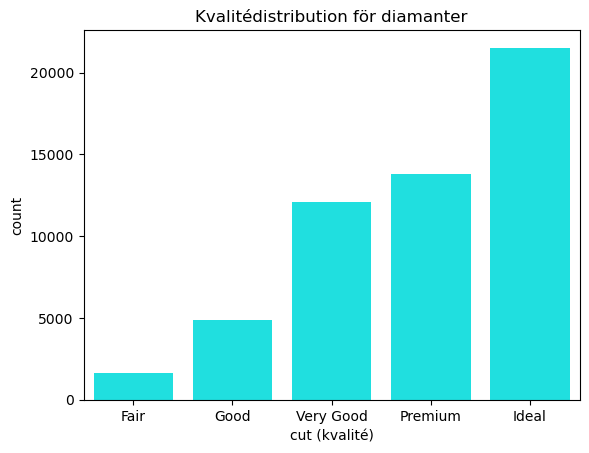

In [8]:
sns.countplot(data=df, x="cut", color="cyan", order=["Fair", "Good", "Very Good", "Premium", "Ideal"])
plt.title("Kvalitédistribution för diamanter")
plt.xlabel("cut (kvalité)")
plt.show()

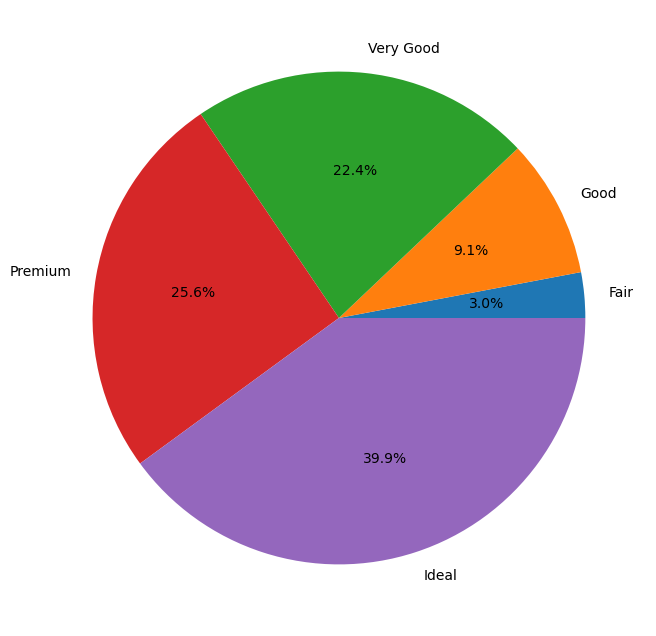

In [9]:
cut_counts = df["cut"].value_counts().reindex(["Fair", "Good", "Very Good", "Premium", "Ideal"])

plt.figure(figsize=(8, 8))
plt.pie(cut_counts, labels=cut_counts.index, autopct="%1.1f%%")
plt.show()

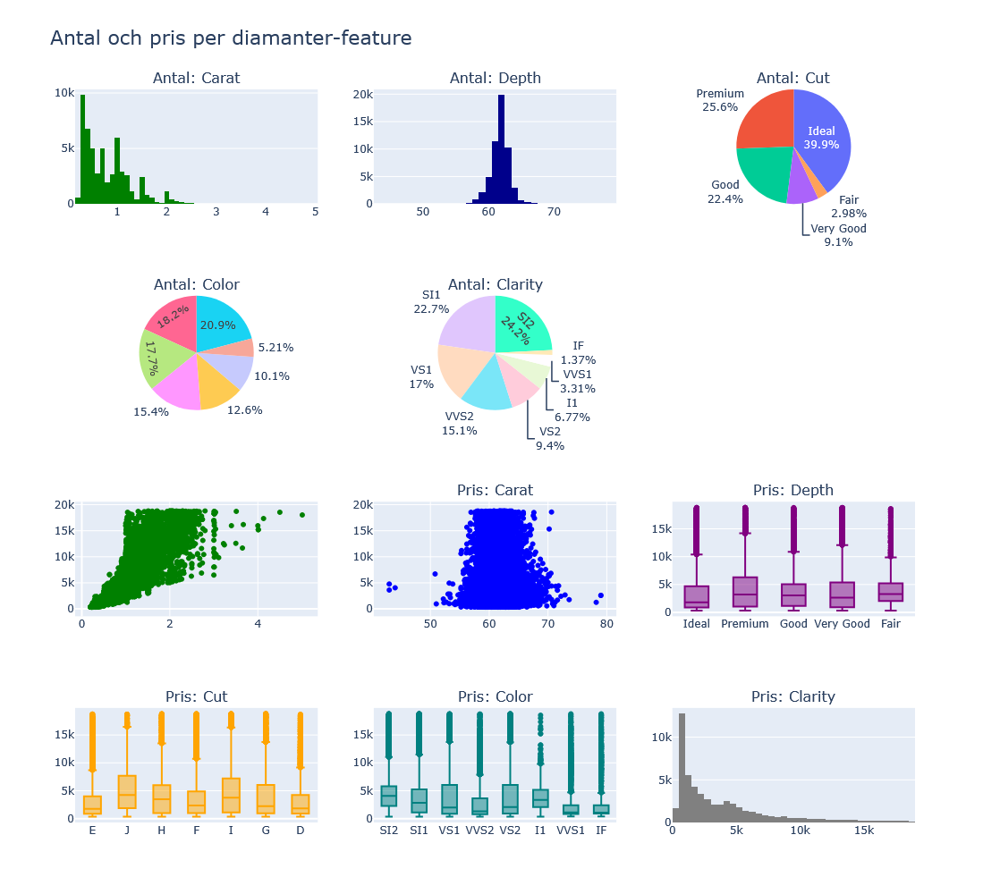

In [13]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
## Subplot för antal diamanter vs features
fig = make_subplots(
    rows=4, cols=3,
    subplot_titles=[
        "Antal: Carat", "Antal: Depth", "Antal: Cut",
        "Antal: Color", "Antal: Clarity", "",
        "Pris: Carat", "Pris: Depth", "Pris: Cut",
        "Pris: Color", "Pris: Clarity", "Prisfördelning"
    ],
    specs=[
        [{"type": "xy"}, {"type": "xy"}, {"type": "domain"}], 
        [{"type": "domain"}, {"type": "domain"}, None],
        [{"type": "xy"}, {"type": "xy"}, {"type": "xy"}],
        [{"type": "xy"}, {"type": "xy"}, {"type": "xy"}]
    ]
)
## Carat-antaldiamanater plot
fig.add_trace(
    go.Histogram(x=df["carat"], nbinsx=50, marker_color="green", name="Carat"),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=df["depth"], nbinsx=50, marker_color="darkblue", name="Depth"),
    row=1, col=2
)
fig.add_trace(
    go.Pie(labels=df["cut"].unique(), values=df["cut"].value_counts(), textinfo="label+percent", name="Cut"),
    row=1, col=3
)
fig.add_trace(
    go.Pie(labels=df["color"].unique(), values=df["color"].value_counts()), 
    row=2, col=1
)
fig.add_trace(
    go.Pie(labels=df["clarity"].unique(), values=df["clarity"].value_counts(), textinfo="label+percent", name="Clarity"),
    row=2, col=2
)
# ------- Pris per feature -------
fig.add_trace(
    go.Scatter(x=df["carat"], y=df["price"], mode='markers', marker=dict(color='green')), 
    row=3, col=1
)
fig.add_trace(
    go.Scatter(x=df["depth"], y=df["price"], mode='markers', marker=dict(color='blue')), 
    row=3, col=2
)
fig.add_trace(
    go.Box(x=df["cut"], y=df["price"], marker_color='purple'), 
    row=3, col=3
)
fig.add_trace(
    go.Box(x=df["color"], y=df["price"], marker_color='orange'), 
    row=4, col=1
)
fig.add_trace(
    go.Box(x=df["clarity"], y=df["price"], marker_color='teal'), 
    row=4, col=2
)
fig.add_trace(
    go.Histogram(x=df["price"], nbinsx=50, marker_color='gray'), 
    row=4, col=3
)

fig.update_layout(
    title_text="Antal och pris per diamanter-feature",
    title_font_size=22,
    showlegend=False,
    width=1200,
    height=1000
)
fig.show()

In [11]:
#carat 0,7-1,2
#depth 60-64
#cut ideal, premium, good
#color, blandad popularitet
#clarity SI1, SI2

In [12]:
volatilitet = df.groupby("clarity")["price"].std().sort_values(ascending=False)

print(volatilitet)

clarity
SI2     4262.754650
VS2     4043.978526
VS1     4013.877048
IF      3924.526965
VVS2    3822.307548
SI1     3802.092339
VVS1    3337.529156
I1      2808.072770
Name: price, dtype: float64
